In [8]:
# !pip install pandas
# !pip install seaborn

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math
import random
import warnings
warnings.filterwarnings('ignore')
from utils import * 

# 1: Business requirements


> Forecasting Solar Power Generation for power plant based on historic timeseries data

> Problem Description:
The goal of this project is to create a solar power generation forecasting model capable of 
predicting energy output for week ahead for the power plants managed by Stellar. The 
model should be accurate, scalable, and deployable in a production environment to provide 
real-time & batch forecasts for operational decision-making.


# 2 : Data collection and understanding.

We have historical power generation (KW) from solar plants and weather data.
weather data include amb temperature, module temperature, atm pressure, GHI, array irradiance, relative humidity, wind speed and wind direction.

In [2]:
solar_data_1=pd.read_csv('Data\original_data\dataset_1.csv')
solar_data_2=pd.read_csv('Data\original_data\dataset_2.csv')

## data understanding

In [3]:
solar_data_1.head()

,ts,WEATHER STATION.WS01.AMBIENT_TEMP_DEGC,WEATHER STATION.WS01.BOM01_TEMP_DEGC,WEATHER STATION.WS01.BOM02_TEMP_DEGC,WEATHER STATION.WS01.BOM03_TEMP_DEGC,WEATHER STATION.WS01.PRESSURE_HPA,WEATHER STATION.WS01.GHI01_IRRADIANCE_WM2,WEATHER STATION.WS01.POA01_IRRADIANCE_WM2,WEATHER STATION.WS01.RELATIVE_HUMIDITY_PER,WEATHER STATION.WS01.IPOA01_IRRADIANCE_WM2,...,WEATHER STATION.WS08.BOM02_TEMP_DEGC,WEATHER STATION.WS08.BOM03_TEMP_DEGC,WEATHER STATION.WS08.PRESSURE_HPA,WEATHER STATION.WS08.GHI01_IRRADIANCE_WM2,WEATHER STATION.WS08.POA01_IRRADIANCE_WM2,WEATHER STATION.WS08.RELATIVE_HUMIDITY_PER,WEATHER STATION.WS08.IPOA01_IRRADIANCE_WM2,WEATHER STATION.WS08.WIND_DIRECTION_DEG,WEATHER STATION.WS08.WIND_SPEED_MS,SUBSTATION.MTR.C1.P_KW
0,2022-01-01 00:00:00-08:00,6.2,2.1,2.1,2.2,1000.0,-2.04,-1.66,65.0,-0.54,...,0.2,-1.0,1002.0,-2.07,-1.38,71.8,-0.76,191.0,2.1,-386.0
1,2022-01-01 00:01:00-08:00,6.2,2.2,2.1,2.2,1000.2,-1.96,-1.63,65.3,-0.54,...,0.2,-1.0,1002.0,-2.04,-1.38,72.2,-0.74,189.8,1.7,-386.0
2,2022-01-01 00:02:00-08:00,6.0,2.2,2.1,2.2,1000.1,-1.88,-1.62,65.8,-0.53,...,0.2,-1.0,1002.0,-2.04,-1.37,72.2,-0.72,193.6,1.9,-391.0
3,2022-01-01 00:03:00-08:00,5.9,2.1,2.1,2.2,1000.2,-1.82,-1.61,66.6,-0.52,...,0.2,-1.0,1002.0,-2.04,-1.34,71.9,-0.69,200.2,1.9,-391.0
4,2022-01-01 00:04:00-08:00,5.7,2.1,2.1,2.1,1000.1,-1.72,-1.57,67.3,-0.54,...,0.2,-1.0,1002.0,-2.07,-1.34,71.2,-0.67,204.6,1.8,-391.0


In [4]:
solar_data_1.tail()

,ts,WEATHER STATION.WS01.AMBIENT_TEMP_DEGC,WEATHER STATION.WS01.BOM01_TEMP_DEGC,WEATHER STATION.WS01.BOM02_TEMP_DEGC,WEATHER STATION.WS01.BOM03_TEMP_DEGC,WEATHER STATION.WS01.PRESSURE_HPA,WEATHER STATION.WS01.GHI01_IRRADIANCE_WM2,WEATHER STATION.WS01.POA01_IRRADIANCE_WM2,WEATHER STATION.WS01.RELATIVE_HUMIDITY_PER,WEATHER STATION.WS01.IPOA01_IRRADIANCE_WM2,...,WEATHER STATION.WS08.BOM02_TEMP_DEGC,WEATHER STATION.WS08.BOM03_TEMP_DEGC,WEATHER STATION.WS08.PRESSURE_HPA,WEATHER STATION.WS08.GHI01_IRRADIANCE_WM2,WEATHER STATION.WS08.POA01_IRRADIANCE_WM2,WEATHER STATION.WS08.RELATIVE_HUMIDITY_PER,WEATHER STATION.WS08.IPOA01_IRRADIANCE_WM2,WEATHER STATION.WS08.WIND_DIRECTION_DEG,WEATHER STATION.WS08.WIND_SPEED_MS,SUBSTATION.MTR.C1.P_KW
305215,2022-07-31 23:55:00-07:00,24.1,22.1,21.9,22.0,998.1,-1.58,-1.53,41.8,-0.46,...,21.6,21.6,1000.0,-1.53,-1.43,45.0,-0.52,290.9,1.8,-368.0
305216,2022-07-31 23:56:00-07:00,24.1,22.1,21.9,22.0,998.1,-1.52,-1.48,41.4,-0.45,...,21.6,21.6,1000.0,-1.52,-1.45,44.6,-0.51,284.6,1.9,-368.0
305217,2022-07-31 23:57:00-07:00,24.2,22.1,21.9,22.0,998.2,-1.53,-1.49,41.3,-0.46,...,21.6,21.5,1000.0,-1.52,-1.45,44.4,-0.50,292.3,2.4,-366.0
305218,2022-07-31 23:58:00-07:00,24.2,22.1,21.9,22.0,998.2,-1.52,-1.48,41.3,-0.46,...,21.6,21.6,1000.0,-1.52,-1.47,44.3,-0.50,300.5,2.4,-366.0
305219,2022-07-31 23:59:00-07:00,24.1,22.1,22.0,22.0,998.2,-1.50,-1.46,41.3,-0.45,...,21.6,21.6,1000.0,-1.51,-1.48,44.1,-0.50,305.5,1.9,-367.0


In [5]:
solar_data_2.head()

,ts,SUBSTATION.MTR.C1.P_KW,WEATHER STATION.WS01.AMBIENT_TEMP_DEGC,WEATHER STATION.WS01.BOM01_TEMP_DEGC,WEATHER STATION.WS01.BOM02_TEMP_DEGC,WEATHER STATION.WS01.BOM03_TEMP_DEGC,WEATHER STATION.WS01.PRESSURE_HPA,WEATHER STATION.WS01.GHI01_IRRADIANCE_WM2,WEATHER STATION.WS01.POA01_IRRADIANCE_WM2,WEATHER STATION.WS01.RELATIVE_HUMIDITY_PER,...,WEATHER STATION.WS08.BOM01_TEMP_DEGC,WEATHER STATION.WS08.BOM02_TEMP_DEGC,WEATHER STATION.WS08.BOM03_TEMP_DEGC,WEATHER STATION.WS08.PRESSURE_HPA,WEATHER STATION.WS08.GHI01_IRRADIANCE_WM2,WEATHER STATION.WS08.POA01_IRRADIANCE_WM2,WEATHER STATION.WS08.RELATIVE_HUMIDITY_PER,WEATHER STATION.WS08.IPOA01_IRRADIANCE_WM2,WEATHER STATION.WS08.WIND_DIRECTION_DEG,WEATHER STATION.WS08.WIND_SPEED_MS
0,2022-08-01 00:00:00-07:00,-367.0,24.1,22.1,22.0,22.0,998.2,-1.47,-1.46,41.4,...,21.7,21.6,21.6,1000.1,-1.51,-1.47,44.0,-0.50,298.9,1.7
1,2022-08-01 00:01:00-07:00,-367.0,24.0,22.1,21.9,22.0,998.3,-1.45,-1.44,41.4,...,21.7,21.6,21.6,1000.0,-1.51,-1.47,43.8,-0.51,293.5,2.1
2,2022-08-01 00:02:00-07:00,-369.0,24.0,22.0,21.9,21.9,998.3,-1.45,-1.45,41.4,...,21.7,21.6,21.6,1000.0,-1.51,-1.49,43.8,-0.51,296.3,2.2
3,2022-08-01 00:03:00-07:00,-368.0,24.0,22.0,21.9,21.9,998.1,-1.44,-1.47,41.5,...,21.7,21.6,21.6,1000.0,-1.51,-1.50,43.7,-0.52,299.5,2.0
4,2022-08-01 00:04:00-07:00,-366.0,24.0,21.9,21.8,21.9,998.3,-1.44,-1.48,41.3,...,21.7,21.6,21.6,1000.1,-1.51,-1.51,43.4,-0.52,297.2,2.2


In [6]:
solar_data_2.tail()

,ts,SUBSTATION.MTR.C1.P_KW,WEATHER STATION.WS01.AMBIENT_TEMP_DEGC,WEATHER STATION.WS01.BOM01_TEMP_DEGC,WEATHER STATION.WS01.BOM02_TEMP_DEGC,WEATHER STATION.WS01.BOM03_TEMP_DEGC,WEATHER STATION.WS01.PRESSURE_HPA,WEATHER STATION.WS01.GHI01_IRRADIANCE_WM2,WEATHER STATION.WS01.POA01_IRRADIANCE_WM2,WEATHER STATION.WS01.RELATIVE_HUMIDITY_PER,...,WEATHER STATION.WS08.BOM01_TEMP_DEGC,WEATHER STATION.WS08.BOM02_TEMP_DEGC,WEATHER STATION.WS08.BOM03_TEMP_DEGC,WEATHER STATION.WS08.PRESSURE_HPA,WEATHER STATION.WS08.GHI01_IRRADIANCE_WM2,WEATHER STATION.WS08.POA01_IRRADIANCE_WM2,WEATHER STATION.WS08.RELATIVE_HUMIDITY_PER,WEATHER STATION.WS08.IPOA01_IRRADIANCE_WM2,WEATHER STATION.WS08.WIND_DIRECTION_DEG,WEATHER STATION.WS08.WIND_SPEED_MS
220375,2022-12-31 23:55:00-08:00,-370.0,11.0,10.2,10.4,10.5,989.3,-0.54,-0.38,74.2,...,10.4,8.2,7.3,991.4,-0.70,-0.45,75.1,-0.71,255.0,4.7
220376,2022-12-31 23:56:00-08:00,-370.0,11.0,10.2,10.4,10.4,989.2,-0.57,-0.39,74.5,...,10.4,8.2,7.4,991.3,-0.71,-0.48,75.2,-0.71,259.3,4.8
220377,2022-12-31 23:57:00-08:00,-371.0,11.0,10.2,10.4,10.4,989.3,-0.60,-0.41,74.2,...,10.4,8.2,7.4,991.3,-0.72,-0.52,74.8,-0.70,258.7,5.0
220378,2022-12-31 23:58:00-08:00,-372.0,11.0,10.2,10.4,10.4,989.4,-0.62,-0.40,74.1,...,10.4,8.2,7.3,991.3,-0.75,-0.54,74.4,-0.69,267.7,4.9
220379,2022-12-31 23:59:00-08:00,-371.0,11.1,10.2,10.4,10.4,989.4,-0.66,-0.41,74.1,...,10.4,8.2,7.4,991.3,-0.75,-0.54,73.9,-0.67,267.7,5.4


In [8]:
print(solar_data_1.shape)
print(solar_data_2.shape)

(305220, 90)
(220380, 90)


In [10]:
solar_data_1.dtypes

ts                                             object
WEATHER STATION.WS01.AMBIENT_TEMP_DEGC        float64
WEATHER STATION.WS01.BOM01_TEMP_DEGC          float64
WEATHER STATION.WS01.BOM02_TEMP_DEGC          float64
WEATHER STATION.WS01.BOM03_TEMP_DEGC          float64
                                               ...   
WEATHER STATION.WS08.RELATIVE_HUMIDITY_PER    float64
WEATHER STATION.WS08.IPOA01_IRRADIANCE_WM2    float64
WEATHER STATION.WS08.WIND_DIRECTION_DEG       float64
WEATHER STATION.WS08.WIND_SPEED_MS            float64
SUBSTATION.MTR.C1.P_KW                        float64
Length: 90, dtype: object

In [11]:
solar_data_2.dtypes

ts                                             object
SUBSTATION.MTR.C1.P_KW                        float64
WEATHER STATION.WS01.AMBIENT_TEMP_DEGC        float64
WEATHER STATION.WS01.BOM01_TEMP_DEGC          float64
WEATHER STATION.WS01.BOM02_TEMP_DEGC          float64
                                               ...   
WEATHER STATION.WS08.POA01_IRRADIANCE_WM2     float64
WEATHER STATION.WS08.RELATIVE_HUMIDITY_PER    float64
WEATHER STATION.WS08.IPOA01_IRRADIANCE_WM2    float64
WEATHER STATION.WS08.WIND_DIRECTION_DEG       float64
WEATHER STATION.WS08.WIND_SPEED_MS            float64
Length: 90, dtype: object

In [13]:
merged_data = pd.concat([solar_data_1, solar_data_2], axis=0)
merged_data

,ts,WEATHER STATION.WS01.AMBIENT_TEMP_DEGC,WEATHER STATION.WS01.BOM01_TEMP_DEGC,WEATHER STATION.WS01.BOM02_TEMP_DEGC,WEATHER STATION.WS01.BOM03_TEMP_DEGC,WEATHER STATION.WS01.PRESSURE_HPA,WEATHER STATION.WS01.GHI01_IRRADIANCE_WM2,WEATHER STATION.WS01.POA01_IRRADIANCE_WM2,WEATHER STATION.WS01.RELATIVE_HUMIDITY_PER,WEATHER STATION.WS01.IPOA01_IRRADIANCE_WM2,...,WEATHER STATION.WS08.BOM02_TEMP_DEGC,WEATHER STATION.WS08.BOM03_TEMP_DEGC,WEATHER STATION.WS08.PRESSURE_HPA,WEATHER STATION.WS08.GHI01_IRRADIANCE_WM2,WEATHER STATION.WS08.POA01_IRRADIANCE_WM2,WEATHER STATION.WS08.RELATIVE_HUMIDITY_PER,WEATHER STATION.WS08.IPOA01_IRRADIANCE_WM2,WEATHER STATION.WS08.WIND_DIRECTION_DEG,WEATHER STATION.WS08.WIND_SPEED_MS,SUBSTATION.MTR.C1.P_KW
0,2022-01-01 00:00:00-08:00,6.2,2.1,2.1,2.2,1000.0,-2.04,-1.66,65.0,-0.54,...,0.2,-1.0,1002.0,-2.07,-1.38,71.8,-0.76,191.0,2.1,-386.0
1,2022-01-01 00:01:00-08:00,6.2,2.2,2.1,2.2,1000.2,-1.96,-1.63,65.3,-0.54,...,0.2,-1.0,1002.0,-2.04,-1.38,72.2,-0.74,189.8,1.7,-386.0
2,2022-01-01 00:02:00-08:00,6.0,2.2,2.1,2.2,1000.1,-1.88,-1.62,65.8,-0.53,...,0.2,-1.0,1002.0,-2.04,-1.37,72.2,-0.72,193.6,1.9,-391.0
3,2022-01-01 00:03:00-08:00,5.9,2.1,2.1,2.2,1000.2,-1.82,-1.61,66.6,-0.52,...,0.2,-1.0,1002.0,-2.04,-1.34,71.9,-0.69,200.2,1.9,-391.0
4,2022-01-01 00:04:00-08:00,5.7,2.1,2.1,2.1,1000.1,-1.72,-1.57,67.3,-0.54,...,0.2,-1.0,1002.0,-2.07,-1.34,71.2,-0.67,204.6,1.8,-391.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220375,2022-12-31 23:55:00-08:00,11.0,10.2,10.4,10.5,989.3,-0.54,-0.38,74.2,-0.57,...,8.2,7.3,991.4,-0.70,-0.45,75.1,-0.71,255.0,4.7,-370.0
220376,2022-12-31 23:56:00-08:00,11.0,10.2,10.4,10.4,989.2,-0.57,-0.39,74.5,-0.56,...,8.2,7.4,991.3,-0.71,-0.48,75.2,-0.71,259.3,4.8,-370.0
220377,2022-12-31 23:57:00-08:00,11.0,10.2,10.4,10.4,989.3,-0.60,-0.41,74.2,-0.57,...,8.2,7.4,991.3,-0.72,-0.52,74.8,-0.70,258.7,5.0,-371.0
220378,2022-12-31 23:58:00-08:00,11.0,10.2,10.4,10.4,989.4,-0.62,-0.40,74.1,-0.57,...,8.2,7.3,991.3,-0.75,-0.54,74.4,-0.69,267.7,4.9,-372.0


In [14]:
merged_data.shape

(525600, 90)

In [15]:
merged_data.columns

Index(['ts', 'WEATHER STATION.WS01.AMBIENT_TEMP_DEGC',
       'WEATHER STATION.WS01.BOM01_TEMP_DEGC',
       'WEATHER STATION.WS01.BOM02_TEMP_DEGC',
       'WEATHER STATION.WS01.BOM03_TEMP_DEGC',
       'WEATHER STATION.WS01.PRESSURE_HPA',
       'WEATHER STATION.WS01.GHI01_IRRADIANCE_WM2',
       'WEATHER STATION.WS01.POA01_IRRADIANCE_WM2',
       'WEATHER STATION.WS01.RELATIVE_HUMIDITY_PER',
       'WEATHER STATION.WS01.IPOA01_IRRADIANCE_WM2',
       'WEATHER STATION.WS01.WIND_DIRECTION_DEG',
       'WEATHER STATION.WS01.WIND_SPEED_MS',
       'WEATHER STATION.WS02.AMBIENT_TEMP_DEGC',
       'WEATHER STATION.WS02.BOM01_TEMP_DEGC',
       'WEATHER STATION.WS02.BOM02_TEMP_DEGC',
       'WEATHER STATION.WS02.BOM03_TEMP_DEGC',
       'WEATHER STATION.WS02.PRESSURE_HPA',
       'WEATHER STATION.WS02.GHI01_IRRADIANCE_WM2',
       'WEATHER STATION.WS02.POA01_IRRADIANCE_WM2',
       'WEATHER STATION.WS02.RELATIVE_HUMIDITY_PER',
       'WEATHER STATION.WS02.IPOA01_IRRADIANCE_WM2',
       'WEA

In [16]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 525600 entries, 0 to 220379
Data columns (total 90 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   ts                                          525600 non-null  object 
 1   WEATHER STATION.WS01.AMBIENT_TEMP_DEGC      524563 non-null  float64
 2   WEATHER STATION.WS01.BOM01_TEMP_DEGC        524559 non-null  float64
 3   WEATHER STATION.WS01.BOM02_TEMP_DEGC        524559 non-null  float64
 4   WEATHER STATION.WS01.BOM03_TEMP_DEGC        524555 non-null  float64
 5   WEATHER STATION.WS01.PRESSURE_HPA           524556 non-null  float64
 6   WEATHER STATION.WS01.GHI01_IRRADIANCE_WM2   524543 non-null  float64
 7   WEATHER STATION.WS01.POA01_IRRADIANCE_WM2   524529 non-null  float64
 8   WEATHER STATION.WS01.RELATIVE_HUMIDITY_PER  524522 non-null  float64
 9   WEATHER STATION.WS01.IPOA01_IRRADIANCE_WM2  524520 non-null  float64
 10  W

- so we have two set of the data in csv format.
- Both have power (KW) and weather data.
- dataset-1 have (1-jan-2022 to 31-Jul-2022)
- dataset-2 have (1-Aug-2022 to 31-Dec-2022)
- data have 60 data points per hour means min granularity.
- it has float data type and significant number of data points are 0, 
- indicating no power generation during night time hours.
- The distribution of power generation for both plants is positively skewed
- overall we have 525600 data points and 90 colums.
- Total we have 08 weather stations for the weather data.
- feature we have amb temperature, module temperature, atm pressure, GHI, array irradiance, relative humidity, wind speed and wind direction.


## Data visualization

array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >], dtyp

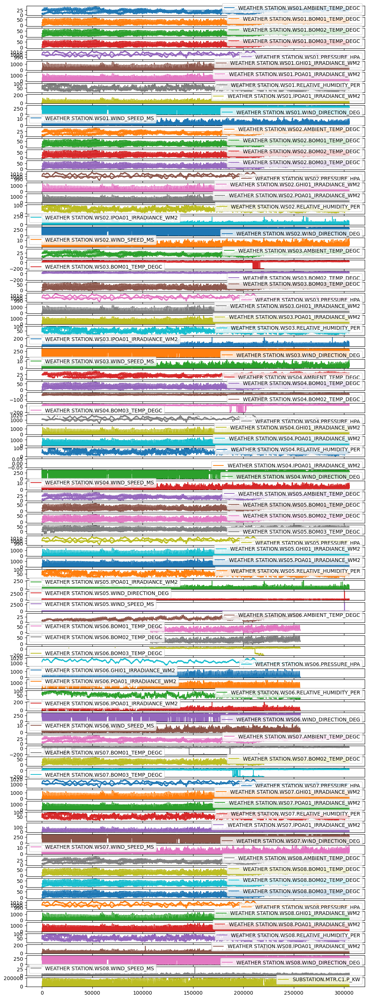

In [19]:
merged_data.plot(subplots=True, figsize=(12,35))

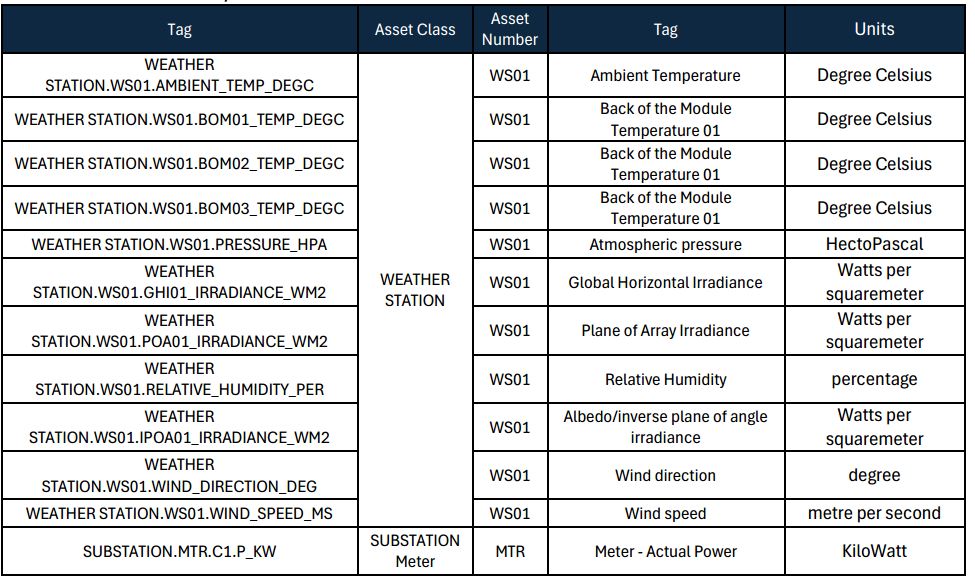

# 3: Data Wrangling

### Renaming and Formatting of column



1. Renamed columns of Power file and column of Weather.
2. data formate and conversion.

In [2]:
merged_data=pd.read_csv('Data\Data_versioning\merge_data.csv', index_col=False)

In [3]:
merged_data.rename(columns={'ts': 'Date_Time'}, inplace= True)

In [4]:
merged_data.columns

Index(['Unnamed: 0', 'Date_Time', 'WEATHER STATION.WS01.AMBIENT_TEMP_DEGC',
       'WEATHER STATION.WS01.BOM01_TEMP_DEGC',
       'WEATHER STATION.WS01.BOM02_TEMP_DEGC',
       'WEATHER STATION.WS01.BOM03_TEMP_DEGC',
       'WEATHER STATION.WS01.PRESSURE_HPA',
       'WEATHER STATION.WS01.GHI01_IRRADIANCE_WM2',
       'WEATHER STATION.WS01.POA01_IRRADIANCE_WM2',
       'WEATHER STATION.WS01.RELATIVE_HUMIDITY_PER',
       'WEATHER STATION.WS01.IPOA01_IRRADIANCE_WM2',
       'WEATHER STATION.WS01.WIND_DIRECTION_DEG',
       'WEATHER STATION.WS01.WIND_SPEED_MS',
       'WEATHER STATION.WS02.AMBIENT_TEMP_DEGC',
       'WEATHER STATION.WS02.BOM01_TEMP_DEGC',
       'WEATHER STATION.WS02.BOM02_TEMP_DEGC',
       'WEATHER STATION.WS02.BOM03_TEMP_DEGC',
       'WEATHER STATION.WS02.PRESSURE_HPA',
       'WEATHER STATION.WS02.GHI01_IRRADIANCE_WM2',
       'WEATHER STATION.WS02.POA01_IRRADIANCE_WM2',
       'WEATHER STATION.WS02.RELATIVE_HUMIDITY_PER',
       'WEATHER STATION.WS02.IPOA01_IRRADIA

In [5]:
columns = ['WEATHER STATION.WS01.AMBIENT_TEMP_DEGC',
            'WEATHER STATION.WS01.BOM01_TEMP_DEGC',
            'WEATHER STATION.WS01.BOM02_TEMP_DEGC',
            'WEATHER STATION.WS01.BOM03_TEMP_DEGC',
            'WEATHER STATION.WS01.PRESSURE_HPA',
            'WEATHER STATION.WS01.GHI01_IRRADIANCE_WM2',
            'WEATHER STATION.WS01.POA01_IRRADIANCE_WM2',
            'WEATHER STATION.WS01.RELATIVE_HUMIDITY_PER',
            'WEATHER STATION.WS01.IPOA01_IRRADIANCE_WM2',
            'WEATHER STATION.WS01.WIND_DIRECTION_DEG',
            'WEATHER STATION.WS01.WIND_SPEED_MS'
]

In [6]:
merged_data.columns = process_column_names(merged_data.columns)
merged_data

,unnamed: 0,date_time,ws01_amb_temp_c,ws01_bom01_temp_c,ws01_bom02_temp_c,ws01_bom03_temp_c,ws01_pressure_hpa,ws01_ghi01__wm2,ws01_poa01__wm2,ws01_rh_per,...,ws08_bom02_temp_c,ws08_bom03_temp_c,ws08_pressure_hpa,ws08_ghi01__wm2,ws08_poa01__wm2,ws08_rh_per,ws08_ipoa01__wm2,ws08_wind_dir_deg,ws08_wind_speed_ms,substation_mtr_c1_p_kw
0,0,2022-01-01 00:00:00-08:00,6.2,2.1,2.1,2.2,1000.0,-2.04,-1.66,65.0,...,0.2,-1.0,1002.0,-2.07,-1.38,71.8,-0.76,191.0,2.1,-386.0
1,1,2022-01-01 00:01:00-08:00,6.2,2.2,2.1,2.2,1000.2,-1.96,-1.63,65.3,...,0.2,-1.0,1002.0,-2.04,-1.38,72.2,-0.74,189.8,1.7,-386.0
2,2,2022-01-01 00:02:00-08:00,6.0,2.2,2.1,2.2,1000.1,-1.88,-1.62,65.8,...,0.2,-1.0,1002.0,-2.04,-1.37,72.2,-0.72,193.6,1.9,-391.0
3,3,2022-01-01 00:03:00-08:00,5.9,2.1,2.1,2.2,1000.2,-1.82,-1.61,66.6,...,0.2,-1.0,1002.0,-2.04,-1.34,71.9,-0.69,200.2,1.9,-391.0
4,4,2022-01-01 00:04:00-08:00,5.7,2.1,2.1,2.1,1000.1,-1.72,-1.57,67.3,...,0.2,-1.0,1002.0,-2.07,-1.34,71.2,-0.67,204.6,1.8,-391.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525595,220375,2022-12-31 23:55:00-08:00,11.0,10.2,10.4,10.5,989.3,-0.54,-0.38,74.2,...,8.2,7.3,991.4,-0.70,-0.45,75.1,-0.71,255.0,4.7,-370.0
525596,220376,2022-12-31 23:56:00-08:00,11.0,10.2,10.4,10.4,989.2,-0.57,-0.39,74.5,...,8.2,7.4,991.3,-0.71,-0.48,75.2,-0.71,259.3,4.8,-370.0
525597,220377,2022-12-31 23:57:00-08:00,11.0,10.2,10.4,10.4,989.3,-0.60,-0.41,74.2,...,8.2,7.4,991.3,-0.72,-0.52,74.8,-0.70,258.7,5.0,-371.0
525598,220378,2022-12-31 23:58:00-08:00,11.0,10.2,10.4,10.4,989.4,-0.62,-0.40,74.1,...,8.2,7.3,991.3,-0.75,-0.54,74.4,-0.69,267.7,4.9,-372.0


In [7]:
merged_data.columns

Index(['unnamed: 0', 'date_time', 'ws01_amb_temp_c', 'ws01_bom01_temp_c',
       'ws01_bom02_temp_c', 'ws01_bom03_temp_c', 'ws01_pressure_hpa',
       'ws01_ghi01__wm2', 'ws01_poa01__wm2', 'ws01_rh_per', 'ws01_ipoa01__wm2',
       'ws01_wind_dir_deg', 'ws01_wind_speed_ms', 'ws02_amb_temp_c',
       'ws02_bom01_temp_c', 'ws02_bom02_temp_c', 'ws02_bom03_temp_c',
       'ws02_pressure_hpa', 'ws02_ghi01__wm2', 'ws02_poa01__wm2',
       'ws02_rh_per', 'ws02_ipoa01__wm2', 'ws02_wind_dir_deg',
       'ws02_wind_speed_ms', 'ws03_amb_temp_c', 'ws03_bom01_temp_c',
       'ws03_bom02_temp_c', 'ws03_bom03_temp_c', 'ws03_pressure_hpa',
       'ws03_ghi01__wm2', 'ws03_poa01__wm2', 'ws03_rh_per', 'ws03_ipoa01__wm2',
       'ws03_wind_dir_deg', 'ws03_wind_speed_ms', 'ws04_amb_temp_c',
       'ws04_bom01_temp_c', 'ws04_bom02_temp_c', 'ws04_bom03_temp_c',
       'ws04_pressure_hpa', 'ws04_ghi01__wm2', 'ws04_poa01__wm2',
       'ws04_rh_per', 'ws04_ipoa01__wm2', 'ws04_wind_dir_deg',
       'ws04_wind_spe

In [8]:
merged_data=merged_data.drop('unnamed: 0', axis=1)

In [9]:
merged_data.head()

,date_time,ws01_amb_temp_c,ws01_bom01_temp_c,ws01_bom02_temp_c,ws01_bom03_temp_c,ws01_pressure_hpa,ws01_ghi01__wm2,ws01_poa01__wm2,ws01_rh_per,ws01_ipoa01__wm2,...,ws08_bom02_temp_c,ws08_bom03_temp_c,ws08_pressure_hpa,ws08_ghi01__wm2,ws08_poa01__wm2,ws08_rh_per,ws08_ipoa01__wm2,ws08_wind_dir_deg,ws08_wind_speed_ms,substation_mtr_c1_p_kw
0,2022-01-01 00:00:00-08:00,6.2,2.1,2.1,2.2,1000.0,-2.04,-1.66,65.0,-0.54,...,0.2,-1.0,1002.0,-2.07,-1.38,71.8,-0.76,191.0,2.1,-386.0
1,2022-01-01 00:01:00-08:00,6.2,2.2,2.1,2.2,1000.2,-1.96,-1.63,65.3,-0.54,...,0.2,-1.0,1002.0,-2.04,-1.38,72.2,-0.74,189.8,1.7,-386.0
2,2022-01-01 00:02:00-08:00,6.0,2.2,2.1,2.2,1000.1,-1.88,-1.62,65.8,-0.53,...,0.2,-1.0,1002.0,-2.04,-1.37,72.2,-0.72,193.6,1.9,-391.0
3,2022-01-01 00:03:00-08:00,5.9,2.1,2.1,2.2,1000.2,-1.82,-1.61,66.6,-0.52,...,0.2,-1.0,1002.0,-2.04,-1.34,71.9,-0.69,200.2,1.9,-391.0
4,2022-01-01 00:04:00-08:00,5.7,2.1,2.1,2.1,1000.1,-1.72,-1.57,67.3,-0.54,...,0.2,-1.0,1002.0,-2.07,-1.34,71.2,-0.67,204.6,1.8,-391.0


In [10]:
merged_data.describe()

,ws01_amb_temp_c,ws01_bom01_temp_c,ws01_bom02_temp_c,ws01_bom03_temp_c,ws01_pressure_hpa,ws01_ghi01__wm2,ws01_poa01__wm2,ws01_rh_per,ws01_ipoa01__wm2,ws01_wind_dir_deg,...,ws08_bom02_temp_c,ws08_bom03_temp_c,ws08_pressure_hpa,ws08_ghi01__wm2,ws08_poa01__wm2,ws08_rh_per,ws08_ipoa01__wm2,ws08_wind_dir_deg,ws08_wind_speed_ms,substation_mtr_c1_p_kw
count,524563.000000,524559.000000,524559.000000,524555.000000,524556.000000,524543.000000,524529.000000,524522.000000,524520.000000,524509.000000,...,525408.000000,525408.000000,525404.000000,525397.000000,525393.000000,525374.000000,525373.000000,525367.000000,525367.000000,524049.000000
mean,18.495936,23.448553,23.734229,23.853394,1000.045829,237.464717,314.159789,49.144564,24.519505,230.086662,...,22.964051,22.633040,1001.929746,230.691565,307.447199,50.727313,20.860547,237.418867,2.258196,55099.684440
std,8.774659,16.331225,16.734628,16.828835,5.332767,323.857485,397.133262,22.881892,30.964134,89.093677,...,16.757659,16.956512,5.376406,316.280053,391.306583,22.798202,26.845818,90.627839,1.493012,71517.296581
min,0.100000,-5.200000,-5.300000,-5.300000,982.500000,-5.810000,-4.910000,5.400000,-4.720000,0.000000,...,-5.000000,-5.200000,984.300000,-6.140000,-4.850000,5.100000,-2.630000,0.000000,0.000000,-658.000000
25%,11.300000,9.800000,9.700000,9.700000,996.200000,-1.810000,-1.560000,30.600000,-0.510000,189.200000,...,9.000000,8.500000,998.100000,-1.880000,-1.390000,32.100000,-0.650000,193.600000,1.200000,-371.000000
50%,17.500000,19.900000,19.900000,19.900000,999.000000,8.180000,8.050000,46.000000,1.480000,241.800000,...,19.000000,18.800000,1000.900000,7.320000,7.610000,48.400000,1.220000,263.500000,1.900000,0.000000
75%,24.900000,35.900000,36.600000,36.800000,1004.100000,467.915000,726.070000,65.500000,54.480000,301.200000,...,35.500000,35.300000,1006.000000,440.960000,702.600000,67.300000,49.150000,305.100000,3.000000,127558.000000
max,45.300000,70.600000,71.500000,71.800000,1015.600000,1430.280000,1513.390000,100.000000,210.480000,360.000000,...,68.400000,68.600000,1017.600000,1415.490000,1463.620000,100.000000,207.710000,360.000000,34.900000,200161.000000


- highest generation is 200MW.
- notice negatives in amb temperature, module temperature, atm pressure, GHI, array irradiance, relative humidity

>## checking negatives value, spikes, zero's, nan_values in data

In [11]:
anomalies_df = detect_anomalies(merged_data, [ 'ws01_amb_temp_c', 'ws01_bom01_temp_c', 'ws01_bom02_temp_c',
                                                'ws01_bom03_temp_c', 'ws01_pressure_hpa', 'ws01_ghi01__wm2',
                                                'ws01_poa01__wm2', 'ws01_rh_per', 'ws01_ipoa01__wm2',
                                                'ws01_wind_dir_deg', 'ws01_wind_speed_ms', 
                                                'ws08_amb_temp_c',
        'ws08_bom01_temp_c', 'ws08_bom02_temp_c', 'ws08_bom03_temp_c',
        'ws08_pressure_hpa', 'ws08_ghi01__wm2', 'ws08_poa01__wm2',
        'ws08_rh_per', 'ws08_ipoa01__wm2', 'ws08_wind_dir_deg',
        'ws08_wind_speed_ms', 'substation_mtr_c1_p_kw'
                                                                        ])
print(anomalies_df)

               column_name  negative_values  spikes  zeros  nan_values
0          ws01_amb_temp_c                0       0      0        1037
1        ws01_bom01_temp_c             5025       0    382        1041
2        ws01_bom02_temp_c             5015       0    488        1041
3        ws01_bom03_temp_c             5025       0    457        1045
4        ws01_pressure_hpa                0       0      0        1044
5          ws01_ghi01__wm2           233644       0    156        1057
6          ws01_poa01__wm2           234754       0    110        1071
7              ws01_rh_per                0       0      0        1078
8         ws01_ipoa01__wm2           237833     331    192        1080
9        ws01_wind_dir_deg                0       0    130        1091
10      ws01_wind_speed_ms                0     897   7430        1091
11         ws08_amb_temp_c               79       0     13         188
12       ws08_bom01_temp_c             6467       0    445         190
13    

In [37]:
(5025/524534)*100

0.9579931901459201

In [38]:
anomalies_df = detect_anomalies(merged_data, [  'ws02_amb_temp_c',
                                            'ws02_bom01_temp_c', 'ws02_bom02_temp_c', 'ws02_bom03_temp_c',
                                            'ws02_pressure_hpa', 'ws02_ghi01__wm2', 'ws02_poa01__wm2',
                                            'ws02_rh_per', 'ws02_ipoa01__wm2', 'ws02_wind_dir_deg',
                                            'ws02_wind_speed_ms', 'ws03_amb_temp_c', 'ws03_bom01_temp_c',
                                            'ws03_bom02_temp_c', 'ws03_bom03_temp_c', 'ws03_pressure_hpa',
                                            'ws03_ghi01__wm2', 'ws03_poa01__wm2', 'ws03_rh_per', 'ws03_ipoa01__wm2',
                                            'ws03_wind_dir_deg', 'ws03_wind_speed_ms'
                                            ])
print(anomalies_df)

           column_name  negative_values  spikes  zeros  nan_values
0      ws02_amb_temp_c              240       0     60          29
1    ws02_bom01_temp_c            12971       0    626          29
2    ws02_bom02_temp_c            13770       0    587          29
3    ws02_bom03_temp_c            10102       0    448          31
4    ws02_pressure_hpa                0       0      0          32
5      ws02_ghi01__wm2           234474       0    296          34
6      ws02_poa01__wm2           237274       0    227          42
7          ws02_rh_per                0       0      0          47
8     ws02_ipoa01__wm2           238517    1152    199          46
9    ws02_wind_dir_deg                0       0    121          51
10  ws02_wind_speed_ms                0    1143  27479          54
11     ws03_amb_temp_c              138       0     59          57
12   ws03_bom01_temp_c            28963   10419    530          58
13   ws03_bom02_temp_c            10382    1278    405        

In [39]:
anomalies_df = detect_anomalies(merged_data, ['ws04_amb_temp_c',
        'ws04_bom01_temp_c', 'ws04_bom02_temp_c', 'ws04_bom03_temp_c',
        'ws04_pressure_hpa', 'ws04_ghi01__wm2', 'ws04_poa01__wm2',
        'ws04_rh_per', 'ws04_ipoa01__wm2', 'ws04_wind_dir_deg',
        'ws04_wind_speed_ms', 'ws05_amb_temp_c', 'ws05_bom01_temp_c',
        'ws05_bom02_temp_c', 'ws05_bom03_temp_c', 'ws05_pressure_hpa',
        'ws05_ghi01__wm2', 'ws05_poa01__wm2', 'ws05_rh_per', 'ws05_ipoa01__wm2',
        'ws05_wind_dir_deg', 'ws05_wind_speed_ms'
                                                ])
print(anomalies_df)

           column_name  negative_values  spikes  zeros  nan_values
0      ws04_amb_temp_c                9       0      1       73683
1    ws04_bom01_temp_c             7565       0    455          74
2    ws04_bom02_temp_c            22031    5103    613          74
3    ws04_bom03_temp_c            13417    7406    354          74
4    ws04_pressure_hpa                0       0      0       73683
5      ws04_ghi01__wm2           189934       0    121       72843
6      ws04_poa01__wm2           239021       0    164          78
7          ws04_rh_per                0       0      0       73686
8     ws04_ipoa01__wm2                0       0      0      525600
9    ws04_wind_dir_deg                0       0    106       73691
10  ws04_wind_speed_ms                0     793   6728       73691
11     ws05_amb_temp_c              162       0     38          84
12   ws05_bom01_temp_c            13133       0    575          84
13   ws05_bom02_temp_c            12308       0    547        

In [40]:
anomalies_df = detect_anomalies(merged_data, ['ws06_amb_temp_c',
        'ws06_bom01_temp_c', 'ws06_bom02_temp_c', 'ws06_bom03_temp_c',
        'ws06_pressure_hpa', 'ws06_ghi01__wm2', 'ws06_poa01__wm2',
        'ws06_rh_per', 'ws06_ipoa01__wm2', 'ws06_wind_dir_deg',
        'ws06_wind_speed_ms', 'ws07_amb_temp_c', 'ws07_bom01_temp_c',
        'ws07_bom02_temp_c', 'ws07_bom03_temp_c', 'ws07_pressure_hpa',
        'ws07_ghi01__wm2', 'ws07_poa01__wm2', 'ws07_rh_per', 'ws07_ipoa01__wm2',
        'ws07_wind_dir_deg', 'ws07_wind_speed_ms'
                                                ])
print(anomalies_df)

           column_name  negative_values  spikes  zeros  nan_values
0      ws06_amb_temp_c              123       0     35      248164
1    ws06_bom01_temp_c              585       0     41      355236
2    ws06_bom02_temp_c              612       0     26      355237
3    ws06_bom03_temp_c             9483    4133     34      355237
4    ws06_pressure_hpa                0       0      0      248170
5      ws06_ghi01__wm2           124418       0    217      248173
6      ws06_poa01__wm2            92080       0     53      304560
7          ws06_rh_per                0       0      0      248184
8     ws06_ipoa01__wm2            92795     298     65      304684
9    ws06_wind_dir_deg                0       0     59      248189
10  ws06_wind_speed_ms                0     435   3411      248189
11     ws07_amb_temp_c               63       0     20         144
12   ws07_bom01_temp_c           106263       0    123         144
13   ws07_bom02_temp_c            11909       0    799        

## plot the anomalies

In [33]:
import plotly.graph_objs as go
def detect_and_plot_anomalies(df, columns, anomaly_type):
    for col in columns:
        if col in df.columns:
            col_data = df[col]
            mean = col_data.mean()
            std = col_data.std()
            spike_threshold = 4 * std

            if anomaly_type == 'spike':
                anomaly_mask = np.abs(col_data - mean) > spike_threshold
                anomaly_label = 'Spike'
            elif anomaly_type == 'negative':
                anomaly_mask = col_data < 0
                anomaly_label = 'Negative Value'
            elif anomaly_type == 'zeros':
                anomaly_mask = col_data == 0
                anomaly_label = 'Zero Value'
            elif anomaly_type == 'nan_values':
                anomaly_mask = col_data.isna()
                anomaly_label = 'NaN Value'
            else:
                raise ValueError(f"Unknown anomaly type: {anomaly_type}")

            normal_data = col_data[~anomaly_mask]
            anomaly_points = col_data[anomaly_mask]

            fig = go.Figure()
            fig.add_trace(go.Scatter(x=normal_data.index, y=normal_data, mode='lines', name=f'{col} (Normal)'))
            fig.add_trace(go.Scatter(x=anomaly_points.index, y=anomaly_points, mode='markers', name=f'{col} ({anomaly_label})', marker=dict(color='red', size=1)))
            
            fig.update_layout(title=f'Anomaly Detection in {col} ({anomaly_label})', xaxis_title='Index', yaxis_title=col)
            fig.show()

In [1]:
# detect_and_plot_anomalies(merged_data, ['ws01_ipoa01__wm2',
#                                         'ws01_wind_speed_ms',
#                                         'ws08_ipoa01__wm2',
#                                         'ws08_wind_speed_ms'], 'spike')


In [2]:
# detect_and_plot_anomalies(merged_data, [ 'ws02_ipoa01__wm2', 
#                                         'ws02_wind_speed_ms',
#                                         'ws03_bom01_temp_c',
#                                         'ws03_bom02_temp_c',
#                                         'ws03_ipoa01__wm2',
#                                         'ws03_wind_speed_ms'
#                                             ], 'spike')

In [3]:
# detect_and_plot_anomalies(merged_data, [ 'ws04_bom02_temp_c', 
#                                         'ws04_bom03_temp_c',
#                                         'ws04_wind_speed_ms',
#                                         'ws05_ipoa01__wm2',
#                                         'ws05_wind_dir_deg',
#                                         'ws05_wind_speed_ms'
#                                             ], 'spike')

In [ ]:
detect_and_plot_anomalies(merged_data, [ 'ws06_bom03_temp_c', 
                                        'ws06_ipoa01__wm2',
                                        'ws06_wind_speed_ms',
                                        'ws07_ipoa01__wm2',
                                        'ws07_wind_speed_ms',
                                        'ws05_wind_speed_ms'
                                            ], 'spike')

>## more inspect into the data by plots

In [42]:
plot_features(merged_data, x_feature='date_time', y_features=['ws01_amb_temp_c', 'ws01_bom01_temp_c', 'ws01_bom02_temp_c',
                                            'ws01_bom03_temp_c', 'ws01_pressure_hpa', 'ws01_ghi01__wm2',
                                            'ws01_poa01__wm2', 'ws01_rh_per', 'ws01_ipoa01__wm2',
                                            'ws01_wind_dir_deg', 'ws01_wind_speed_ms', 'substation_mtr_c1_p_kw'], duration='5000:10000')

In [43]:
plot_features(merged_data, x_feature='date_time', y_features=['ws01_ghi01__wm2', 'ws01_poa01__wm2', 'ws02_ghi01__wm2',
                                            'ws02_poa01__wm2', 'ws03_ghi01__wm2', 'ws03_poa01__wm2',
                                            'ws04_ghi01__wm2', 'ws04_poa01__wm2', 'ws05_ghi01__wm2', 
                                            'ws05_poa01__wm2', 'ws06_ghi01__wm2', 'ws06_poa01__wm2',
                                            'ws07_ghi01__wm2', 'ws07_poa01__wm2', 'ws08_ghi01__wm2',
                                            'ws08_poa01__wm2', 'substation_mtr_c1_p_kw'], duration='5000:10000')

>## we have see the generation have very high value and in KW so we can convert it to MW to perform eda.

In [45]:
merged_data = convert_kw_to_mw(merged_data, 'substation_mtr_c1_p_kw')

In [4]:
# plot_features(merged_data, x_feature='date_time', y_features=['substation_mtr_c1_p_kw'], duration='5000:15000')

>## we can the generation is start in data time and stop in night_time

In [5]:
# plot_features(merged_data, x_feature='date_time', y_features=['ws01_amb_temp_c', 'ws01_bom01_temp_c', 'ws01_bom02_temp_c',
#                                             'ws01_bom03_temp_c', 'ws01_pressure_hpa', 'ws01_ghi01__wm2',
#                                             'ws01_poa01__wm2', 'ws01_rh_per', 'ws01_ipoa01__wm2',
#                                             'ws01_wind_dir_deg', 'ws01_wind_speed_ms', 'substation_mtr_c1_p_kw'], duration='5000:100000')

In [6]:
# plot_features(merged_data, x_feature='date_time', y_features=['ws01_ghi01__wm2', 'ws01_poa01__wm2', 'ws02_ghi01__wm2',
#                                             'ws02_poa01__wm2', 'ws03_ghi01__wm2', 'ws03_poa01__wm2',
#                                             'ws04_ghi01__wm2', 'ws04_poa01__wm2', 'ws05_ghi01__wm2', 
#                                             'ws05_poa01__wm2', 'ws06_ghi01__wm2', 'ws06_poa01__wm2',
#                                             'ws07_ghi01__wm2', 'ws07_poa01__wm2', 'ws08_ghi01__wm2',
#                                             'ws08_poa01__wm2', 'substation_mtr_c1_p_kw'], duration='5000:10000')

>## we have noticed variation in ghi and kw generation.

In [50]:
df_cleaned = impute_negative_values(merged_data,[
                                    'ws01_amb_temp_c', 'ws01_bom01_temp_c', 'ws01_bom02_temp_c',
                                    'ws01_bom03_temp_c', 'ws01_pressure_hpa', 'ws01_ghi01__wm2',
                                    'ws01_poa01__wm2', 'ws01_rh_per', 'ws01_ipoa01__wm2',
                                    'ws01_wind_dir_deg', 'ws01_wind_speed_ms', 'ws02_amb_temp_c',
                                    'ws02_bom01_temp_c', 'ws02_bom02_temp_c', 'ws02_bom03_temp_c',
                                    'ws02_pressure_hpa', 'ws02_ghi01__wm2', 'ws02_poa01__wm2',
                                    'ws02_rh_per', 'ws02_ipoa01__wm2', 'ws02_wind_dir_deg',
                                    'ws02_wind_speed_ms', 'ws03_amb_temp_c', 'ws03_bom01_temp_c',
                                    'ws03_bom02_temp_c', 'ws03_bom03_temp_c', 'ws03_pressure_hpa',
                                    'ws03_ghi01__wm2', 'ws03_poa01__wm2', 'ws03_rh_per', 'ws03_ipoa01__wm2',
                                    'ws03_wind_dir_deg', 'ws03_wind_speed_ms', 'ws04_amb_temp_c',
                                    'ws04_bom01_temp_c', 'ws04_bom02_temp_c', 'ws04_bom03_temp_c',
                                    'ws04_pressure_hpa', 'ws04_ghi01__wm2', 'ws04_poa01__wm2',
                                    'ws04_rh_per', 'ws04_ipoa01__wm2', 'ws04_wind_dir_deg',
                                    'ws04_wind_speed_ms', 'ws05_amb_temp_c', 'ws05_bom01_temp_c',
                                    'ws05_bom02_temp_c', 'ws05_bom03_temp_c', 'ws05_pressure_hpa',
                                    'ws05_ghi01__wm2', 'ws05_poa01__wm2', 'ws05_rh_per', 'ws05_ipoa01__wm2',
                                    'ws05_wind_dir_deg', 'ws05_wind_speed_ms', 'ws06_amb_temp_c',
                                    'ws06_bom01_temp_c', 'ws06_bom02_temp_c', 'ws06_bom03_temp_c',
                                    'ws06_pressure_hpa', 'ws06_ghi01__wm2', 'ws06_poa01__wm2',
                                    'ws06_rh_per', 'ws06_ipoa01__wm2', 'ws06_wind_dir_deg',
                                    'ws06_wind_speed_ms', 'ws07_amb_temp_c', 'ws07_bom01_temp_c',
                                    'ws07_bom02_temp_c', 'ws07_bom03_temp_c', 'ws07_pressure_hpa',
                                    'ws07_ghi01__wm2', 'ws07_poa01__wm2', 'ws07_rh_per', 'ws07_ipoa01__wm2',
                                    'ws07_wind_dir_deg', 'ws07_wind_speed_ms', 'ws08_amb_temp_c',
                                    'ws08_bom01_temp_c', 'ws08_bom02_temp_c', 'ws08_bom03_temp_c',
                                    'ws08_pressure_hpa', 'ws08_ghi01__wm2', 'ws08_poa01__wm2',
                                    'ws08_rh_per', 'ws08_ipoa01__wm2', 'ws08_wind_dir_deg',
                                    'ws08_wind_speed_ms', 'substation_mtr_c1_p_kw']
                                    )

In [40]:

# df_cleaned.to_csv(r'Data\Data_versioning\no_negative_solar_data.csv', index=False)  # Saving the cleaned file


In [7]:
# plot_features(df_cleaned, x_feature='ts', y_features=['substation_mtr_c1_p_kw'], duration='5000:1524563')

In [51]:
df_cleaned = impute_spikes(df_cleaned, [
                                    'ws01_amb_temp_c', 'ws01_bom01_temp_c', 'ws01_bom02_temp_c',
                                    'ws01_bom03_temp_c', 'ws01_pressure_hpa', 'ws01_ghi01__wm2',
                                    'ws01_poa01__wm2', 'ws01_rh_per', 'ws01_ipoa01__wm2',
                                    'ws01_wind_dir_deg', 'ws01_wind_speed_ms', 'ws02_amb_temp_c',
                                    'ws02_bom01_temp_c', 'ws02_bom02_temp_c', 'ws02_bom03_temp_c',
                                    'ws02_pressure_hpa', 'ws02_ghi01__wm2', 'ws02_poa01__wm2',
                                    'ws02_rh_per', 'ws02_ipoa01__wm2', 'ws02_wind_dir_deg',
                                    'ws02_wind_speed_ms', 'ws03_amb_temp_c', 'ws03_bom01_temp_c',
                                    'ws03_bom02_temp_c', 'ws03_bom03_temp_c', 'ws03_pressure_hpa',
                                    'ws03_ghi01__wm2', 'ws03_poa01__wm2', 'ws03_rh_per', 'ws03_ipoa01__wm2',
                                    'ws03_wind_dir_deg', 'ws03_wind_speed_ms', 'ws04_amb_temp_c',
                                    'ws04_bom01_temp_c', 'ws04_bom02_temp_c', 'ws04_bom03_temp_c',
                                    'ws04_pressure_hpa', 'ws04_ghi01__wm2', 'ws04_poa01__wm2',
                                    'ws04_rh_per', 'ws04_ipoa01__wm2', 'ws04_wind_dir_deg',
                                    'ws04_wind_speed_ms', 'ws05_amb_temp_c', 'ws05_bom01_temp_c',
                                    'ws05_bom02_temp_c', 'ws05_bom03_temp_c', 'ws05_pressure_hpa',
                                    'ws05_ghi01__wm2', 'ws05_poa01__wm2', 'ws05_rh_per', 'ws05_ipoa01__wm2',
                                    'ws05_wind_dir_deg', 'ws05_wind_speed_ms', 'ws06_amb_temp_c',
                                    'ws06_bom01_temp_c', 'ws06_bom02_temp_c', 'ws06_bom03_temp_c',
                                    'ws06_pressure_hpa', 'ws06_ghi01__wm2', 'ws06_poa01__wm2',
                                    'ws06_rh_per', 'ws06_ipoa01__wm2', 'ws06_wind_dir_deg',
                                    'ws06_wind_speed_ms', 'ws07_amb_temp_c', 'ws07_bom01_temp_c',
                                    'ws07_bom02_temp_c', 'ws07_bom03_temp_c', 'ws07_pressure_hpa',
                                    'ws07_ghi01__wm2', 'ws07_poa01__wm2', 'ws07_rh_per', 'ws07_ipoa01__wm2',
                                    'ws07_wind_dir_deg', 'ws07_wind_speed_ms', 'ws08_amb_temp_c',
                                    'ws08_bom01_temp_c', 'ws08_bom02_temp_c', 'ws08_bom03_temp_c',
                                    'ws08_pressure_hpa', 'ws08_ghi01__wm2', 'ws08_poa01__wm2',
                                    'ws08_rh_per', 'ws08_ipoa01__wm2', 'ws08_wind_dir_deg',
                                    'ws08_wind_speed_ms', 'substation_mtr_c1_p_kw']
                                    )

In [52]:
df_cleaned = fill_nan_with_zero(df_cleaned)

In [54]:
columns_with_spikes = identify_spikes(df_cleaned, df_cleaned.columns)
print(f"Columns with spikes: {columns_with_spikes}")

In [56]:
df_cleaned = second_stage_imputation(df_cleaned, columns=[ 'ws06_ghi01__wm2','ws06_poa01__wm2', 'ws06_ipoa01__wm2'])

Imputing spikes in columns: ['ws06_ghi01__wm2', 'ws06_poa01__wm2', 'ws06_ipoa01__wm2']
Imputing spikes in columns: ['ws06_ghi01__wm2', 'ws06_ipoa01__wm2']
Imputing spikes in columns: ['ws06_ipoa01__wm2']


In [57]:
col=['ws01_amb_temp_c', 'ws01_bom01_temp_c', 'ws01_bom02_temp_c','ws01_bom03_temp_c', 'ws01_pressure_hpa', 
'ws01_rh_per', 'ws01_wind_dir_deg', 'ws01_wind_speed_ms', 'ws02_amb_temp_c',
'ws02_bom01_temp_c', 'ws02_bom02_temp_c', 'ws02_bom03_temp_c',
'ws02_pressure_hpa', 'ws02_rh_per', 'ws02_wind_dir_deg',
'ws02_wind_speed_ms', 'ws03_amb_temp_c', 'ws03_bom01_temp_c',
'ws03_bom02_temp_c', 'ws03_bom03_temp_c', 'ws03_pressure_hpa',
'ws03_rh_per', 'ws03_wind_dir_deg', 'ws03_wind_speed_ms', 'ws04_amb_temp_c',
'ws04_bom01_temp_c', 'ws04_bom02_temp_c', 'ws04_bom03_temp_c',
'ws04_pressure_hpa', 'ws04_rh_per', 'ws04_wind_dir_deg',
'ws04_wind_speed_ms', 'ws05_amb_temp_c', 'ws05_bom01_temp_c',
'ws05_bom02_temp_c', 'ws05_bom03_temp_c', 'ws05_pressure_hpa',
'ws05_rh_per', 'ws05_wind_dir_deg', 'ws05_wind_speed_ms', 'ws06_amb_temp_c',
'ws06_bom01_temp_c', 'ws06_bom02_temp_c', 'ws06_bom03_temp_c',
'ws06_pressure_hpa', 'ws06_rh_per', 'ws06_wind_dir_deg',
'ws06_wind_speed_ms', 'ws07_amb_temp_c', 'ws07_bom01_temp_c',
'ws07_bom02_temp_c', 'ws07_bom03_temp_c', 'ws07_pressure_hpa',
'ws07_rh_per', 'ws07_wind_dir_deg', 'ws07_wind_speed_ms', 'ws08_amb_temp_c',
'ws08_bom01_temp_c', 'ws08_bom02_temp_c', 'ws08_bom03_temp_c',
'ws08_pressure_hpa', 'ws08_rh_per', 'ws08_wind_dir_deg', 'ws08_wind_speed_ms']

In [58]:
df_cleaned = impute_zeros_with_sklearn(df_cleaned, col, strategy='mean')

In [59]:
df_cleaned.columns

Index(['date_time', 'ws01_amb_temp_c', 'ws01_bom01_temp_c',
       'ws01_bom02_temp_c', 'ws01_bom03_temp_c', 'ws01_pressure_hpa',
       'ws01_ghi01__wm2', 'ws01_poa01__wm2', 'ws01_rh_per', 'ws01_ipoa01__wm2',
       'ws01_wind_dir_deg', 'ws01_wind_speed_ms', 'ws02_amb_temp_c',
       'ws02_bom01_temp_c', 'ws02_bom02_temp_c', 'ws02_bom03_temp_c',
       'ws02_pressure_hpa', 'ws02_ghi01__wm2', 'ws02_poa01__wm2',
       'ws02_rh_per', 'ws02_ipoa01__wm2', 'ws02_wind_dir_deg',
       'ws02_wind_speed_ms', 'ws03_amb_temp_c', 'ws03_bom01_temp_c',
       'ws03_bom02_temp_c', 'ws03_bom03_temp_c', 'ws03_pressure_hpa',
       'ws03_ghi01__wm2', 'ws03_poa01__wm2', 'ws03_rh_per', 'ws03_ipoa01__wm2',
       'ws03_wind_dir_deg', 'ws03_wind_speed_ms', 'ws04_amb_temp_c',
       'ws04_bom01_temp_c', 'ws04_bom02_temp_c', 'ws04_bom03_temp_c',
       'ws04_pressure_hpa', 'ws04_ghi01__wm2', 'ws04_poa01__wm2',
       'ws04_rh_per', 'ws04_ipoa01__wm2', 'ws04_wind_dir_deg',
       'ws04_wind_speed_ms', 'ws05_

In [140]:
df_cleaned = impute_radiation_based_on_solar_power(df_cleaned, 'substation_mtr_c1_p_kw', ['ws01_ghi01__wm2', 
                                                                                        'ws01_poa01__wm2', 'ws01_ipoa01__wm2',
                                                    'ws02_ghi01__wm2', 'ws02_poa01__wm2', 'ws02_ipoa01__wm2',
                                                    'ws03_ghi01__wm2', 'ws03_poa01__wm2', 'ws03_ipoa01__wm2',
                                                    'ws04_ghi01__wm2', 'ws04_poa01__wm2', 'ws04_ipoa01__wm2',
                                                    'ws05_ghi01__wm2', 'ws05_poa01__wm2', 'ws05_ipoa01__wm2',
                                                    'ws06_ghi01__wm2', 'ws06_poa01__wm2', 'ws06_ipoa01__wm2',
                                                    'ws07_ghi01__wm2', 'ws07_poa01__wm2', 'ws07_ipoa01__wm2',
                                                    'ws08_ghi01__wm2', 'ws08_poa01__wm2', 'ws08_ipoa01__wm2'])

In [19]:
df_cleaned = impute_radiation_based_on_solar_power_2(df_cleaned, 'substation_mtr_c1_p_kw', ['ws04_ipoa01__wm2'])

In [27]:
anomalies_df = detect_anomalies(df_cleaned, ['ws04_ipoa01__wm2', 'substation_mtr_c1_p_kw'])
print(anomalies_df)

              column_name  negative_values  spikes   zeros  nan_values
0        ws04_ipoa01__wm2                0       0  263728           0
1  substation_mtr_c1_p_kw                0       0  263728           0


In [8]:
# plot_features(df_cleaned, x_feature='ts', y_features=['ws04_ipoa01__wm2', 'substation_mtr_c1_p_kw', 'ws04_poa01__wm2'], duration='5000:525600')

In [24]:
df_cleaned = copy_average_to_colA(df_cleaned, 'ws04_ipoa01__wm2', [ 'ws01_ipoa01__wm2',
                                                            'ws02_ipoa01__wm2',
                                                        'ws03_ipoa01__wm2',
                                                        'ws04_ipoa01__wm2',
                                                        'ws05_ipoa01__wm2',
                                                        'ws06_ipoa01__wm2',
                                                        'ws07_ipoa01__wm2',
                                                        'ws08_ipoa01__wm2'])

>## "ws04_ipoa01__wm2" column has all have zero value and during night time have NAN value. So impute the value with the average of all same columns.

In [61]:

# df_cleaned.to_csv(r'Data\Data_versioning\final_clean_solar_data.csv', index=False)  # Saving the cleaned file

>## EDA

In [75]:
df_solar_data = pd.read_csv(r"Data\Data_versioning\final_clean_solar_data.csv", index_col=False)

In [76]:
df_solar_data

,date_time,ws01_amb_temp_c,ws01_bom01_temp_c,ws01_bom02_temp_c,ws01_bom03_temp_c,ws01_pressure_hpa,ws01_ghi01__wm2,ws01_poa01__wm2,ws01_rh_per,ws01_ipoa01__wm2,...,ws08_bom02_temp_c,ws08_bom03_temp_c,ws08_pressure_hpa,ws08_ghi01__wm2,ws08_poa01__wm2,ws08_rh_per,ws08_ipoa01__wm2,ws08_wind_dir_deg,ws08_wind_speed_ms,substation_mtr_c1_p_kw
0,2022-01-01 00:00:00-08:00,6.2,2.1,2.1,2.2,1000.0,0.0,0.0,65.0,0.0,...,0.2,22.107693,1002.0,0.0,0.0,71.8,0.0,191.0,2.10000,0.0
1,2022-01-01 00:01:00-08:00,6.2,2.2,2.1,2.2,1000.2,0.0,0.0,65.3,0.0,...,0.2,22.107693,1002.0,0.0,0.0,72.2,0.0,189.8,1.70000,0.0
2,2022-01-01 00:02:00-08:00,6.0,2.2,2.1,2.2,1000.1,0.0,0.0,65.8,0.0,...,0.2,22.107693,1002.0,0.0,0.0,72.2,0.0,193.6,1.90000,0.0
3,2022-01-01 00:03:00-08:00,5.9,2.1,2.1,2.2,1000.2,0.0,0.0,66.6,0.0,...,0.2,22.107693,1002.0,0.0,0.0,71.9,0.0,200.2,1.90000,0.0
4,2022-01-01 00:04:00-08:00,5.7,2.1,2.1,2.1,1000.1,0.0,0.0,67.3,0.0,...,0.2,22.107693,1002.0,0.0,0.0,71.2,0.0,204.6,1.80000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525595,2022-12-31 23:55:00-08:00,11.0,10.2,10.4,10.5,989.3,0.0,0.0,74.2,0.0,...,8.2,7.300000,991.4,0.0,0.0,75.1,0.0,255.0,4.70000,0.0
525596,2022-12-31 23:56:00-08:00,11.0,10.2,10.4,10.4,989.2,0.0,0.0,74.5,0.0,...,8.2,7.400000,991.3,0.0,0.0,75.2,0.0,259.3,4.80000,0.0
525597,2022-12-31 23:57:00-08:00,11.0,10.2,10.4,10.4,989.3,0.0,0.0,74.2,0.0,...,8.2,7.400000,991.3,0.0,0.0,74.8,0.0,258.7,2.18755,0.0
525598,2022-12-31 23:58:00-08:00,11.0,10.2,10.4,10.4,989.4,0.0,0.0,74.1,0.0,...,8.2,7.300000,991.3,0.0,0.0,74.4,0.0,267.7,4.90000,0.0


In [77]:
df_solar_data['date_time'] = pd.to_datetime(df_solar_data['date_time'])

In [79]:
print(df_solar_data['date_time'].dtype)

object


In [80]:
df_solar_data['date_time'] = pd.to_datetime(df_solar_data['date_time'], format='%Y-%m-%d %H:%M:%S%z', errors='coerce')

In [81]:
print(df_solar_data['date_time'].dtype)

datetime64[ns, UTC-08:00]


In [82]:
df_solar_data['date_time'] = df_solar_data['date_time'].dt.tz_convert('UTC')

In [85]:
df_solar_data.set_index('date_time', inplace=True)

In [88]:
correlation_values=df_solar_data.corr()["substation_mtr_c1_p_kw"]

In [93]:
sorted_correlation = correlation_values.sort_values(ascending=False).head(35)
print(sorted_correlation)

substation_mtr_c1_p_kw    1.000000
ws01_poa01__wm2           0.974114
ws03_poa01__wm2           0.973717
ws08_poa01__wm2           0.973444
ws07_poa01__wm2           0.972524
ws05_poa01__wm2           0.972384
ws04_poa01__wm2           0.972202
ws02_poa01__wm2           0.968537
ws04_ipoa01__wm2          0.949367
ws08_ipoa01__wm2          0.948723
ws07_ipoa01__wm2          0.945835
ws01_ipoa01__wm2          0.940112
ws02_ipoa01__wm2          0.934017
ws03_ipoa01__wm2          0.932951
ws05_ipoa01__wm2          0.925986
ws01_ghi01__wm2           0.871666
ws03_ghi01__wm2           0.871601
ws05_ghi01__wm2           0.870518
ws02_ghi01__wm2           0.870301
ws07_ghi01__wm2           0.867325
ws08_ghi01__wm2           0.864476
ws04_ghi01__wm2           0.853485
ws03_bom02_temp_c         0.805908
ws03_bom03_temp_c         0.805251
ws08_bom01_temp_c         0.802138
ws01_bom03_temp_c         0.800906
ws01_bom02_temp_c         0.800764
ws08_bom02_temp_c         0.795965
ws01_bom01_temp_c   

In [94]:
sorted_correlation = correlation_values.sort_values(ascending=True).head(35)
print(sorted_correlation)

ws03_rh_per          -0.458380
ws05_rh_per          -0.455657
ws08_rh_per          -0.441847
ws07_rh_per          -0.435173
ws02_rh_per          -0.431511
ws01_rh_per          -0.426276
ws04_rh_per          -0.402601
ws06_rh_per          -0.246030
ws06_bom01_temp_c    -0.184733
ws06_bom02_temp_c    -0.183392
ws06_bom03_temp_c    -0.182516
ws05_pressure_hpa    -0.101186
ws07_pressure_hpa    -0.093840
ws08_pressure_hpa    -0.086537
ws02_pressure_hpa    -0.086083
ws01_pressure_hpa    -0.081200
ws03_pressure_hpa    -0.075187
ws06_pressure_hpa    -0.070716
ws06_wind_speed_ms    0.007635
ws04_wind_dir_deg     0.077673
ws01_wind_speed_ms    0.134147
ws07_wind_speed_ms    0.134939
ws04_wind_speed_ms    0.179029
ws04_pressure_hpa     0.185003
ws03_wind_speed_ms    0.195906
ws08_wind_speed_ms    0.203275
ws05_wind_speed_ms    0.211720
ws02_wind_speed_ms    0.213030
ws02_wind_dir_deg     0.218127
ws06_amb_temp_c       0.219066
ws06_wind_dir_deg     0.251199
ws08_wind_dir_deg     0.316028
ws01_win

>## we have noticed ghi, poa, ipoa and module temperature has the highest correlation.

>## we have noticed ghi, poa, ipoa and module temperature have lowest and negative correlation.

In [102]:
import math
import random
def plot_boxplot(df):
  cols = df.columns
  col_len = len(cols)
  no_col = 3
  no_row = math.ceil(col_len/no_col)
  colors = ['#'+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in range(no_row)]
  plt.figure(figsize=(48,35))
  for col in df.columns:
      col_index = df.columns.get_loc(col)
      plt.subplot(no_row, no_col, col_index+1)
      sns.boxplot(x=df[col], color=colors[col_index%no_row])
      # plt.title(col)
      plt.tight_layout()
  plt.show()

In [96]:
merged_data_boxplt = df_solar_data.copy()

In [98]:
# merged_data_boxplt.drop(columns=["date_time"], axis=1, inplace=True)

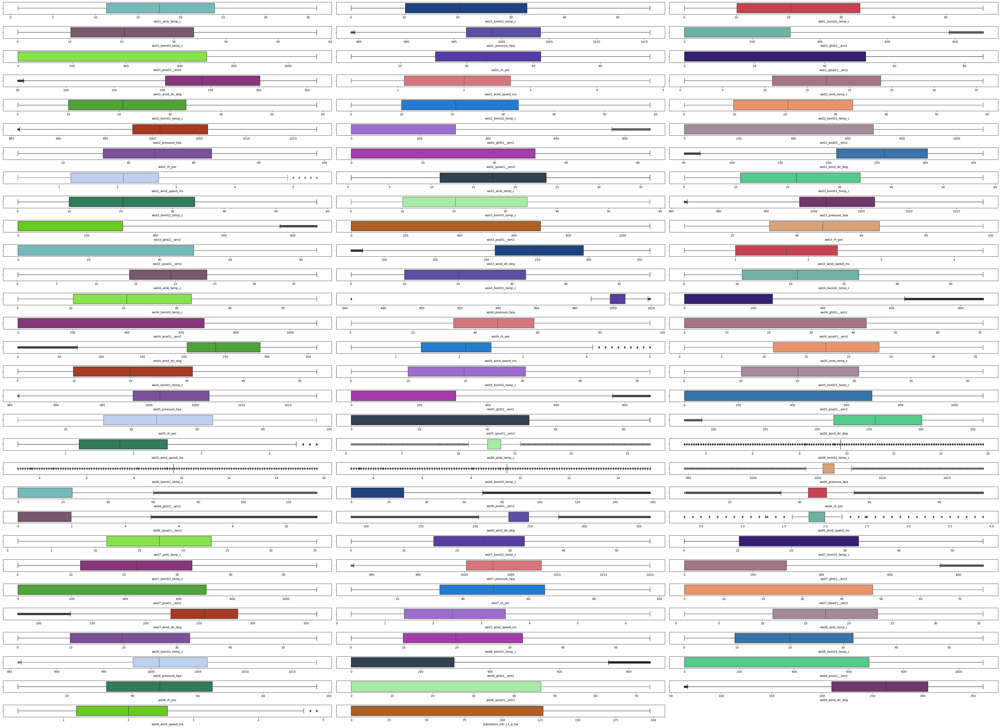

In [103]:
plot_boxplot(merged_data_boxplt)

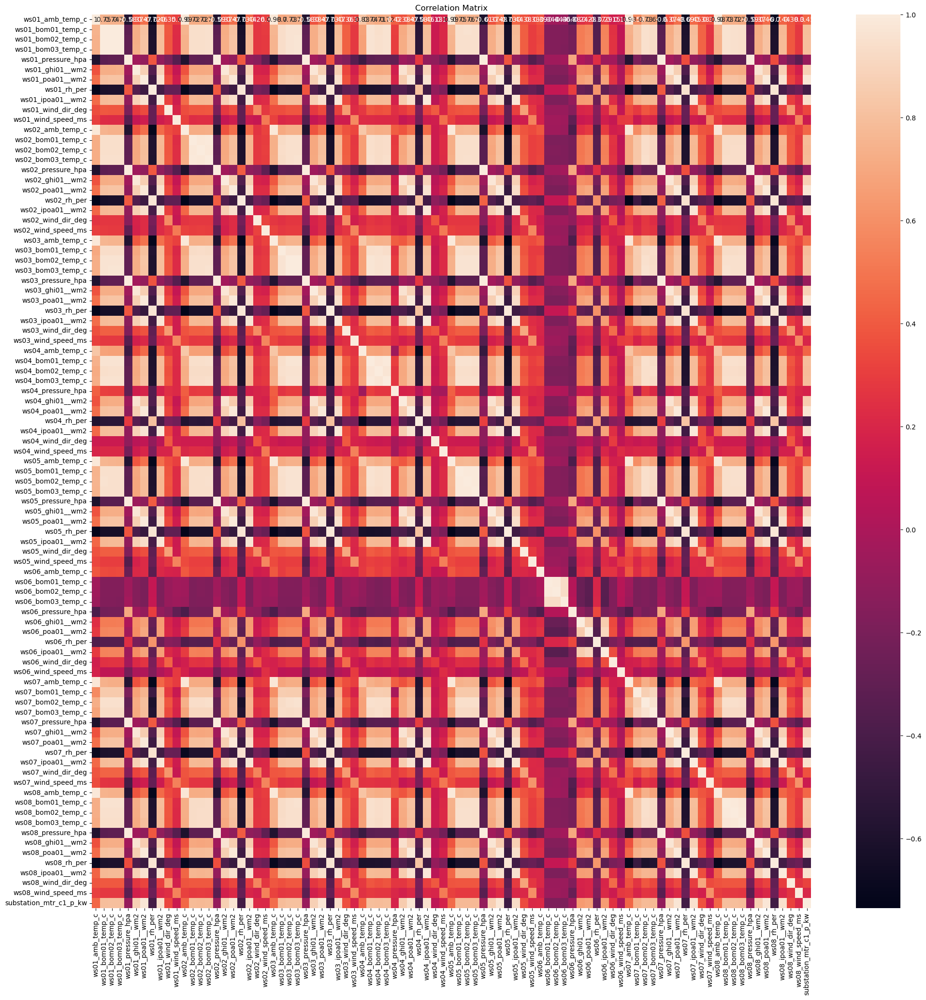

In [104]:
plt.figure(figsize=(24,24))
corr = merged_data_boxplt.corr()
sns.heatmap( corr, annot=True)
plt.title("Correlation Matrix")
plt.show()

### Observation
1.   From above plots we observed feature having correlation more then 0.90
2.   Power generation has good correlation with solar irridation feature and module temperature.

Due to high correlated feature, we are considering regression for prediction.

In [131]:
def drop_low_correlation_columns(df, target_col, threshold=0.7):
    correlation_values = df.corr()[target_col]
    cols_to_drop = correlation_values[abs(correlation_values) < threshold].index
    df_dropped = df.drop(columns=cols_to_drop)
    return df_dropped

In [132]:
target_column = 'substation_mtr_c1_p_kw'

In [133]:
# Drop columns with correlation less than 70%
df_filtered = drop_low_correlation_columns(df_solar_data, target_column, threshold=0.7)

In [134]:
df_filtered.columns

Index(['ws01_bom01_temp_c', 'ws01_bom02_temp_c', 'ws01_bom03_temp_c',
       'ws01_ghi01__wm2', 'ws01_poa01__wm2', 'ws01_ipoa01__wm2',
       'ws02_bom01_temp_c', 'ws02_bom02_temp_c', 'ws02_bom03_temp_c',
       'ws02_ghi01__wm2', 'ws02_poa01__wm2', 'ws02_ipoa01__wm2',
       'ws03_bom01_temp_c', 'ws03_bom02_temp_c', 'ws03_bom03_temp_c',
       'ws03_ghi01__wm2', 'ws03_poa01__wm2', 'ws03_ipoa01__wm2',
       'ws04_bom01_temp_c', 'ws04_bom02_temp_c', 'ws04_bom03_temp_c',
       'ws04_ghi01__wm2', 'ws04_poa01__wm2', 'ws04_ipoa01__wm2',
       'ws05_bom01_temp_c', 'ws05_bom02_temp_c', 'ws05_bom03_temp_c',
       'ws05_ghi01__wm2', 'ws05_poa01__wm2', 'ws05_ipoa01__wm2',
       'ws07_bom01_temp_c', 'ws07_bom02_temp_c', 'ws07_bom03_temp_c',
       'ws07_ghi01__wm2', 'ws07_poa01__wm2', 'ws07_ipoa01__wm2',
       'ws08_bom01_temp_c', 'ws08_bom02_temp_c', 'ws08_bom03_temp_c',
       'ws08_ghi01__wm2', 'ws08_poa01__wm2', 'ws08_ipoa01__wm2',
       'substation_mtr_c1_p_kw'],
      dtype='object')

In [138]:
df_filtered.to_csv(r'Data\Data_versioning\corr_df_filtered.csv', index = False)

# 4: Modeling, Model analysis and hyperparameter tunning

prepare a train-test set, build models,analyze performance metrics.

In [139]:
# !pip install pycaret --user

In [9]:
df_filtered=pd.read_csv(r"Data\Data_versioning\corr_df_filtered.csv", index_col=False)

In [10]:
from pycaret.regression import *

In [11]:
setup_regressors = setup(df_filtered, target = 'substation_mtr_c1_p_kw', session_id = 987)

,Description,Value
0,Session id,987
1,Target,substation_mtr_c1_p_kw
2,Target type,Regression
3,Original data shape,"(525600, 43)"
4,Transformed data shape,"(525600, 43)"
5,Transformed train set shape,"(367920, 43)"
6,Transformed test set shape,"(157680, 43)"
7,Numeric features,42
8,Preprocess,True
9,Imputation type,simple


#### Observation of pycaret setup

**Dataset:**

Original dataset contains 525600 rows and 90 columns.
After preprocessing, the dataset has 525600 rows and 90 columns. This indicates new features were created or existing features were transformed.

**Target Variable:**

The target variable for prediction is 'substation_mtr_c1_p_kw' and it's a regression problem.

**Data Splitting:**

The dataset is split into a training set (367920 rows) and a test set (157680 rows).

**Preprocessing:**


*   PyCaret performed imputation (filling missing values) using simple methods: mean for numeric columns and mode for categorical columns.


**Modeling Settings:**

*   10-fold cross-validation will be used for model evaluation.
*   The experiment will run on the CPU.
* Experiment logging is disabled.

In [12]:
models = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,1.4049,34.0010,5.8282,0.9933,0.0911,0.1136,13.4370
rf,Random Forest Regressor,1.7965,47.8169,6.9116,0.9906,0.1032,0.1466,31.3550
knn,K Neighbors Regressor,2.3194,80.7526,8.9833,0.9841,0.1136,0.1592,6.3920
lightgbm,Light Gradient Boosting Machine,3.3367,90.4283,9.5072,0.9822,0.1464,0.2795,0.5710
dt,Decision Tree Regressor,2.2578,106.4245,10.3154,0.9790,0.1380,0.1215,1.0430
gbr,Gradient Boosting Regressor,4.4035,150.1873,12.2527,0.9704,0.2099,0.3657,16.5940
lr,Linear Regression,5.7203,205.4328,14.3304,0.9595,0.5370,0.7430,0.3530
ridge,Ridge Regression,5.7215,205.4314,14.3304,0.9595,0.5373,0.7428,0.2080
br,Bayesian Ridge,5.7167,205.4345,14.3305,0.9595,0.5361,0.7431,0.3610
en,Elastic Net,5.5251,207.6808,14.4085,0.9591,0.4473,0.7800,1.2840


>Conclusion
- Best Performers: Extra Trees Regressor and Random Forest Regressor are the best-performing models with the lowest error metrics and highest R2 scores.
- Worst Performers: Orthogonal Matching Pursuit, Linear Regression, and Ridge Regression show higher error metrics and less accuracy.
- Training Time: Models like LightGBM and Lasso Least Angle Regression offer faster training times, but this often comes at the cost of slightly reduced accuracy

> we have top three model
- Extra Trees Regressor	
- Random Forest Regressor	
- K Neighbors Regressor

### Model prepararion and analysis

**CV-Train** :  The performance metrics calculated on the training portion of the data during each fold of cross-validation. This gives an indication of how well the model fits the training data.

**CV-Val**: The performance metrics calculated on the validation portion of the data during each fold of cross-validation. This provides a more realistic estimate of the model's performance on unseen data.

> Random forest

In [13]:
import matplotlib.image as mpimg

# Load your images

def plot_val_model(model):
    plot_model(model, plot = 'residuals', save=True)
    plot_model(model, plot = 'error', save=True)
    plot_model(model, plot = 'feature', save=True)
    img1 = mpimg.imread('residuals.png')
    img2 = mpimg.imread('Prediction Error.png')
    img3 = mpimg.imread('Feature Importance.png')

    # Create a figure with 3 subplots in a row
    fig, axs = plt.subplots(1, 3, figsize=(24, 6))  # Adjust figsize as needed
    plt.subplots_adjust(wspace=0, hspace=0)
    # Display images in each subplot
    axs[0].imshow(img1)
    axs[1].imshow(img2)
    axs[2].imshow(img3)

    # Remove axis ticks and labels (optional)
    for ax in axs:
        ax.axis('off')

    plt.show()

In [14]:
rf = create_model('rf',return_train_score=True)

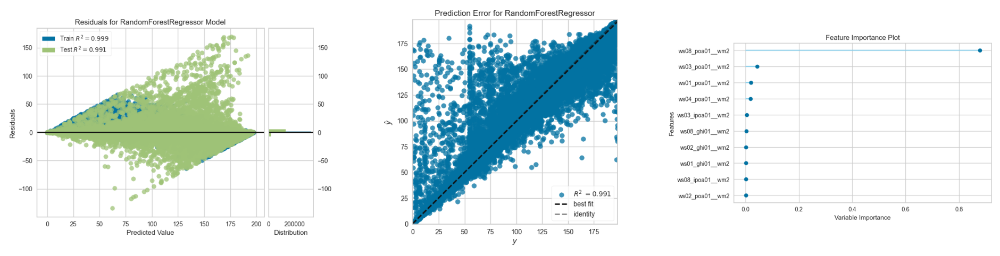

In [15]:
plot_val_model(rf)

In [20]:
# evaluate_model(rf)

> Extra tree regressor

In [21]:
extra_trees = create_model('et', return_train_score=True)

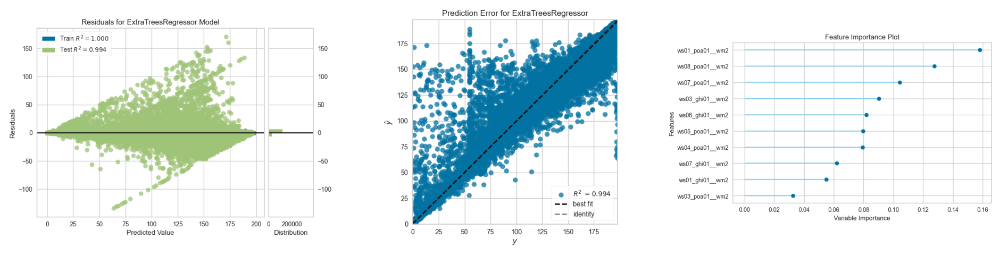

In [22]:
plot_val_model(extra_trees)

In [23]:
# evaluate_model(extra_trees)

> K neighbors

In [24]:
knn = create_model('knn', return_train_score=True)

In [ ]:
# evaluate_model(knn)

### Model tunning 

In [29]:
pred=predict_model(extra_trees)
pred

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extra Trees Regressor,1.3564,32.6381,5.7130,0.9936,0.0905,0.1005


,ws01_bom01_temp_c,ws01_bom02_temp_c,ws01_bom03_temp_c,ws01_ghi01__wm2,ws01_poa01__wm2,ws01_ipoa01__wm2,ws02_bom01_temp_c,ws02_bom02_temp_c,ws02_bom03_temp_c,ws02_ghi01__wm2,...,ws07_poa01__wm2,ws07_ipoa01__wm2,ws08_bom01_temp_c,ws08_bom02_temp_c,ws08_bom03_temp_c,ws08_ghi01__wm2,ws08_poa01__wm2,ws08_ipoa01__wm2,substation_mtr_c1_p_kw,prediction_label
322729,16.500000,16.400000,16.400000,0.000000,0.000000,0.000000,15.300000,15.300000,15.300000,0.000000,...,0.000000,0.000000,16.000000,16.000000,15.900000,0.000000,0.000000,0.000000,0.000000,0.000000
163379,48.700001,49.700001,50.099998,237.448090,988.950012,70.489998,48.700001,48.700001,49.500000,234.379898,...,998.479980,60.189999,47.799999,47.500000,46.299999,231.007660,987.500000,59.360001,92.579002,102.118471
273934,22.000000,22.700001,21.799999,78.709999,152.639999,25.360001,20.600000,20.400000,20.500000,75.169998,...,144.000000,19.090000,19.100000,18.900000,18.900000,84.220001,182.679993,23.590000,25.726999,25.554220
387601,12.500000,12.300000,12.400000,0.000000,0.000000,0.000000,13.300000,13.300000,13.300000,0.000000,...,0.000000,0.000000,13.700000,13.700000,13.600000,0.000000,0.000000,0.000000,0.000000,0.000000
118966,50.099998,51.500000,52.000000,648.640015,912.429993,58.410000,46.599998,47.000000,47.500000,665.940002,...,924.609985,54.299999,50.599998,51.000000,50.500000,666.080017,905.880005,54.700001,184.544006,184.212579
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236749,43.700001,44.799999,45.200001,237.448090,1043.969971,80.410004,46.299999,46.500000,47.200001,234.379898,...,1050.550049,69.040001,50.400002,50.000000,50.099998,856.799988,1031.140015,67.110001,184.602005,184.021162
151995,40.000000,40.200001,40.299999,286.269989,375.059998,32.689999,42.700001,42.299999,42.299999,234.379898,...,1002.820007,63.259998,40.700001,40.200001,38.599998,231.007660,983.989990,62.770000,175.656006,147.795121
356367,55.900002,56.799999,57.200001,865.190002,876.729980,77.910004,58.599998,58.900002,59.200001,861.239990,...,893.440002,67.230003,56.299999,56.400002,22.663559,853.590027,865.349976,61.730000,154.399994,153.989201
166699,18.500000,18.500000,18.500000,51.990002,79.440002,6.520000,19.299999,19.400000,19.500000,49.060001,...,85.309998,5.460000,18.000000,18.000000,16.200001,50.180000,53.189999,4.680000,11.100000,10.748280


In [44]:
# pred.to_csv("pred.csv")

In [54]:
df=pd.read_csv("pred.csv", index_col=False)
blind_data=pd.read_csv("blind_data.csv", index_col=False)

In [49]:
df

,index,ws01_bom01_temp_c,ws01_bom02_temp_c,ws01_bom03_temp_c,ws01_ghi01__wm2,ws01_poa01__wm2,ws01_ipoa01__wm2,ws02_bom01_temp_c,ws02_bom02_temp_c,ws02_bom03_temp_c,...,ws07_poa01__wm2,ws07_ipoa01__wm2,ws08_bom01_temp_c,ws08_bom02_temp_c,ws08_bom03_temp_c,ws08_ghi01__wm2,ws08_poa01__wm2,ws08_ipoa01__wm2,substation_mtr_c1_p_kw,prediction_label
0,6,2.0,2.0,2.1,0.0,0.0,0.0,0.5,22.88153,0.8,...,0.0,0.0,0.6,0.2,22.107693,0.0,0.0,0.0,0.0,0.0
1,14,1.9,1.9,2.0,0.0,0.0,0.0,0.8,22.88153,1.1,...,0.0,0.0,0.7,0.4,22.107693,0.0,0.0,0.0,0.0,0.0
2,16,1.9,1.9,2.0,0.0,0.0,0.0,0.8,22.88153,1.0,...,0.0,0.0,0.7,0.4,22.107693,0.0,0.0,0.0,0.0,0.0
3,20,2.0,1.9,2.0,0.0,0.0,0.0,0.7,22.88153,1.0,...,0.0,0.0,0.7,0.4,22.107693,0.0,0.0,0.0,0.0,0.0
4,22,1.9,1.9,2.0,0.0,0.0,0.0,0.8,22.88153,1.1,...,0.0,0.0,0.7,0.4,22.107693,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157675,525588,10.4,10.6,10.6,0.0,0.0,0.0,4.4,8.20000,6.7,...,0.0,0.0,10.5,8.2,7.400000,0.0,0.0,0.0,0.0,0.0
157676,525591,10.3,10.5,10.5,0.0,0.0,0.0,4.3,8.10000,6.7,...,0.0,0.0,10.4,8.2,7.400000,0.0,0.0,0.0,0.0,0.0
157677,525594,10.2,10.4,10.5,0.0,0.0,0.0,4.2,7.90000,6.5,...,0.0,0.0,10.4,8.2,7.400000,0.0,0.0,0.0,0.0,0.0
157678,525596,10.2,10.4,10.4,0.0,0.0,0.0,4.1,7.90000,6.5,...,0.0,0.0,10.4,8.2,7.400000,0.0,0.0,0.0,0.0,0.0


In [51]:
plot_features(df, x_feature='index', y_features=[ 'substation_mtr_c1_p_kw', 'prediction_label'], duration='0:5000')

## Next 7-days forcast

In [55]:
pred_7=predict_model(extra_trees, data=blind_data)
pred_7

,date_time,ws01_bom01_temp_c,ws01_bom02_temp_c,ws01_bom03_temp_c,ws01_ghi01__wm2,ws01_poa01__wm2,ws01_ipoa01__wm2,ws02_bom01_temp_c,ws02_bom02_temp_c,ws02_bom03_temp_c,...,ws07_ghi01__wm2,ws07_poa01__wm2,ws07_ipoa01__wm2,ws08_bom01_temp_c,ws08_bom02_temp_c,ws08_bom03_temp_c,ws08_ghi01__wm2,ws08_poa01__wm2,ws08_ipoa01__wm2,prediction_label
0,01-01-2023 0:00:00,14.5,14.4,14.5,0.0,0.0,0.0,13.4,13.5,13.5,...,0.0,0.0,0.0,13.2,13.3,13.1,0.0,0.0,0.0,0.0
1,01-01-2023 0:01:00,14.5,14.4,14.5,0.0,0.0,0.0,13.4,13.5,13.5,...,0.0,0.0,0.0,13.2,13.3,13.1,0.0,0.0,0.0,0.0
2,01-01-2023 0:02:00,14.6,14.5,14.6,0.0,0.0,0.0,13.3,13.4,13.4,...,0.0,0.0,0.0,13.3,13.3,13.1,0.0,0.0,0.0,0.0
3,01-01-2023 0:03:00,14.6,14.5,14.6,0.0,0.0,0.0,13.3,13.3,13.4,...,0.0,0.0,0.0,13.3,13.4,13.2,0.0,0.0,0.0,0.0
4,01-01-2023 0:04:00,14.7,14.6,14.7,0.0,0.0,0.0,13.2,13.3,13.4,...,0.0,0.0,0.0,13.3,13.4,13.2,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11515,08-01-2023 23:55:00,10.4,10.2,10.2,0.0,0.0,0.0,9.4,9.5,9.5,...,0.0,0.0,0.0,10.1,10.1,10.0,0.0,0.0,0.0,0.0
11516,08-01-2023 23:56:00,10.3,10.1,10.2,0.0,0.0,0.0,9.4,9.5,9.5,...,0.0,0.0,0.0,10.1,10.1,10.0,0.0,0.0,0.0,0.0
11517,08-01-2023 23:57:00,10.2,10.1,10.1,0.0,0.0,0.0,9.4,9.5,9.5,...,0.0,0.0,0.0,10.1,10.1,10.0,0.0,0.0,0.0,0.0
11518,08-01-2023 23:58:00,10.2,10.0,10.1,0.0,0.0,0.0,9.4,9.4,9.5,...,0.0,0.0,0.0,10.0,10.0,9.9,0.0,0.0,0.0,0.0


In [59]:
pred_7.columns

Index(['date_time', 'ws01_bom01_temp_c', 'ws01_bom02_temp_c',
       'ws01_bom03_temp_c', 'ws01_ghi01__wm2', 'ws01_poa01__wm2',
       'ws01_ipoa01__wm2', 'ws02_bom01_temp_c', 'ws02_bom02_temp_c',
       'ws02_bom03_temp_c', 'ws02_ghi01__wm2', 'ws02_poa01__wm2',
       'ws02_ipoa01__wm2', 'ws03_bom01_temp_c', 'ws03_bom02_temp_c',
       'ws03_bom03_temp_c', 'ws03_ghi01__wm2', 'ws03_poa01__wm2',
       'ws03_ipoa01__wm2', 'ws04_bom01_temp_c', 'ws04_bom02_temp_c',
       'ws04_bom03_temp_c', 'ws04_ghi01__wm2', 'ws04_poa01__wm2',
       'ws04_ipoa01__wm2', 'ws05_bom01_temp_c', 'ws05_bom02_temp_c',
       'ws05_bom03_temp_c', 'ws05_ghi01__wm2', 'ws05_poa01__wm2',
       'ws05_ipoa01__wm2', 'ws07_bom01_temp_c', 'ws07_bom02_temp_c',
       'ws07_bom03_temp_c', 'ws07_ghi01__wm2', 'ws07_poa01__wm2',
       'ws07_ipoa01__wm2', 'ws08_bom01_temp_c', 'ws08_bom02_temp_c',
       'ws08_bom03_temp_c', 'ws08_ghi01__wm2', 'ws08_poa01__wm2',
       'ws08_ipoa01__wm2', 'prediction_label'],
      dtype='o

In [61]:
plot_features(pred_7, x_feature='date_time', y_features=[ 'ws08_bom01_temp_c', 'ws08_bom02_temp_c',
    'ws08_bom03_temp_c', 'ws08_ghi01__wm2', 'ws08_poa01__wm2',
    'ws08_ipoa01__wm2', 'prediction_label'], duration='0:5000')